In [1]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

from metrics import calculate_metrics

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=300)
pd.set_option('display.max_columns', None)
seed = 10
np.random.seed(seed)

R_HOME is already set to: /vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R


Unable to determine R library path: Command '('/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 127.


/gpfs/gibbs/project/wang_zuoheng/xx244/Ndreamer/benchmark/metrics.py:29: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:241: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '


In [2]:
def run_cell_anova(adata, batch_key, condition_key, control_name, cell_type_label, dataset_name):
    if np.max(adata.X) > 15:
        sc.pp.filter_cells(adata, min_genes=300)
        sc.pp.filter_genes(adata, min_cells=10)

        sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
        sc.pp.log1p(adata)

    if adata.shape[1] > 3000:
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, batch_key=batch_key)
        adata = adata[:, adata.var["highly_variable"]].copy()
    else:
        sc.pp.highly_variable_genes(adata, n_top_genes=adata.shape[1], batch_key=batch_key)

    import warnings

    # Suppress all warnings
    warnings.filterwarnings("ignore")

    integrate_key = batch_key
    adata.obs['dataidx'] = adata.obs[batch_key].copy()
    #adata_prep = cnova.model.preprocess_data(adata, integrate_key='dataidx')

    batch = np.unique(adata.obs[integrate_key])
    list_batch = []
    for x in batch:
        adata_iter = adata[adata.obs[integrate_key] == x]
        list_batch.append(adata_iter)

    adata_prep = ad.concat(list_batch)
    adata_prep.layers['lognorm'] = adata_prep.X
    
    if adata.shape[1] > 3000:
        sc.pp.highly_variable_genes(adata_prep, n_top_genes=3000, batch_key=batch_key)
        adata_prep = adata_prep[:, adata.var["highly_variable"]].copy()
    else:
        sc.pp.highly_variable_genes(adata_prep, n_top_genes=adata.shape[1], batch_key=batch_key)
    
    sc.pp.scale(adata_prep)
    adata_prep.layers['scale'] = adata_prep.X

    control_batches = list(set(adata_prep[adata_prep.obs[condition_key] == control_name,].obs[batch_key]))
    control_dict = {
        'g1': control_batches,
    }
    adata_prep = cnova.model.calc_ME(adata_prep, integrate_key='dataidx')
    adata_prep = cnova.model.calc_BE(adata_prep, integrate_key, control_dict)
    adata_prep = cnova.model.calc_TE(adata_prep, integrate_key)
    print(control_dict)
    adata_prep.obs['PseudoState'] = adata_prep.obs[condition_key].copy()
    adata_prep.write_h5ad("./cellanova/" + dataset_name + "_results.h5ad")

    integrated = ad.AnnData(adata_prep.layers['denoised'], dtype=np.float32)
    integrated.obs = adata_prep.obs.copy()
    integrated.var_names = adata_prep.var_names

    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15, n_pcs=30)
    sc.tl.umap(integrated)
    if cell_type_label is not None:
        sc.pl.umap(integrated, color=['dataidx', cell_type_label],ncols=1)
    else:
        sc.pl.umap(integrated, color='dataidx')
    
    res = cnova.utils.calc_oobNN(integrated, batch_key='dataidx', condition_key='PseudoState')
    df = res.obsm['knn_prop']
    df['condition'] = res.obs['PseudoState']
    df.index.name = "index"
    df = df.reset_index()
    df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
    df = df.rename(columns={'index': 'obs_name'})
    df.to_csv("./cellanova/" + dataset_name + "_oobNN.csv")

    g = sea.FacetGrid(df, col='neighbor', hue='condition')
    g.map(sea.kdeplot, 'proportion', bw_adjust=2, alpha=1)
    g.set(xlabel='NN proportion', ylabel='Density')
    g.add_legend()
    plt.suptitle('CellANOVA integration')
    sea.set_style('white')
    plt.show()

# (EC)CITE-seq

https://www.nature.com/articles/s41588-021-00778-2

2025-01-07 22:51:21,741 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2025-01-07 22:51:24,839 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-01-07 22:51:24,912 - harmonypy - INFO - Iteration 1 of 30


2025-01-07 22:51:29,272 - harmonypy - INFO - Iteration 2 of 30


2025-01-07 22:51:33,568 - harmonypy - INFO - Iteration 3 of 30


2025-01-07 22:51:37,931 - harmonypy - INFO - Converged after 3 iterations


{'g1': ['rep3', 'rep2', 'rep1']}


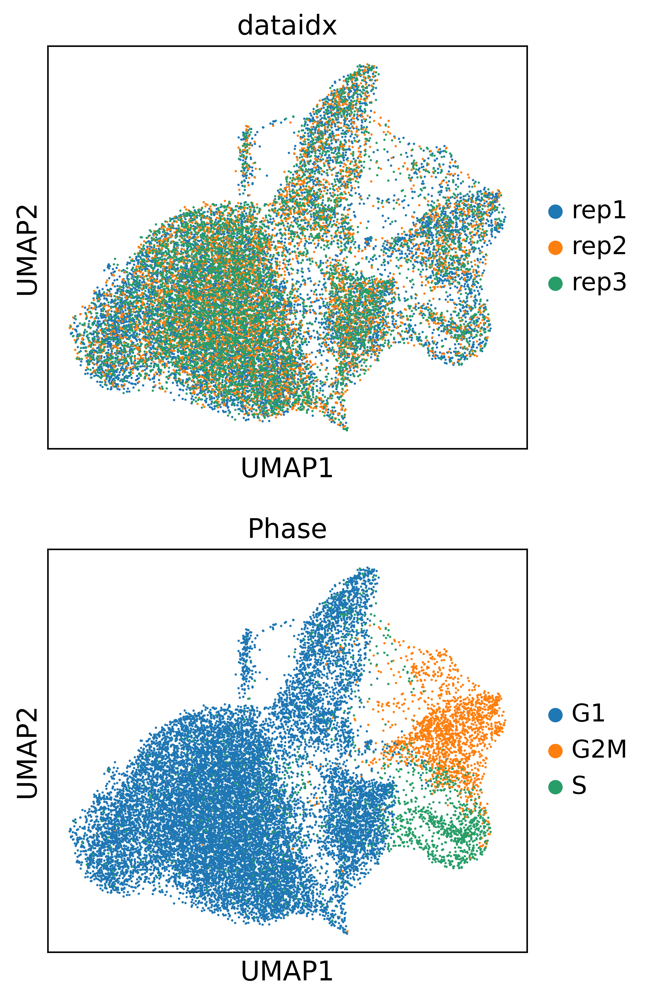

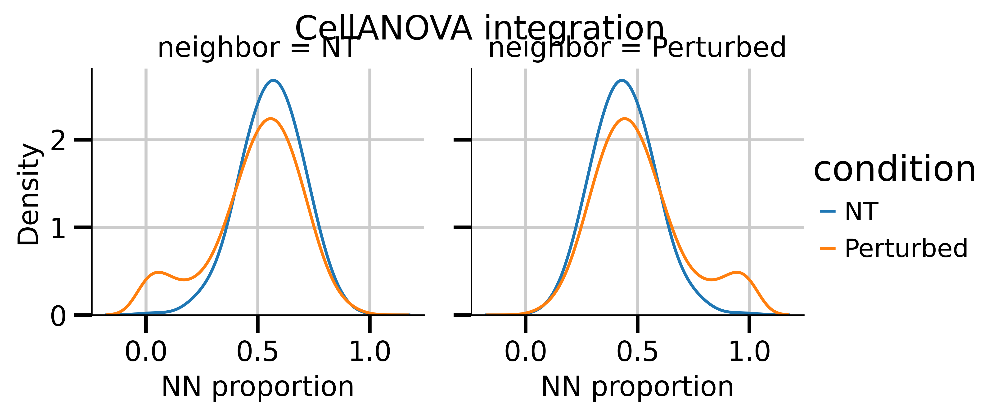

In [3]:
adata=sc.read_h5ad("../data/ECCITE.h5ad")
run_cell_anova(adata=adata, batch_key='replicate', condition_key='perturbation', control_name='NT', cell_type_label="Phase", dataset_name="ECCITE")

In [4]:
adata_prep=sc.read_h5ad("./cellanova/" + "ECCITE" + "_results.h5ad")
integrated = ad.AnnData(adata_prep.layers['denoised'], dtype=np.float32)
integrated.obs = adata_prep.obs.copy()
integrated.var_names = adata_prep.var_names
res = cnova.utils.calc_oobNN(integrated, batch_key='dataidx', condition_key='PseudoState')
print(res.obsm['knn_prop'])

                           NT  Perturbed
index                                   
l1_AAACCTGAGCCAGAAC  0.428571   0.571429
l1_AAACCTGAGTGGACGT  0.785714   0.214286
l1_AAACCTGCATGAGCGA  0.071429   0.928571
l1_AAACCTGTCTTGTCAT  0.642857   0.357143
l1_AAACGGGAGAACAACT  0.357143   0.642857
...                       ...        ...
l8_TTTGTCAAGACTTGAA  0.500000   0.500000
l8_TTTGTCAGTCACTTCC  0.428571   0.571429
l8_TTTGTCAGTTCCACAA  0.500000   0.500000
l8_TTTGTCATCACGCATA  0.714286   0.285714
l8_TTTGTCATCTGTACGA  0.500000   0.500000

[20729 rows x 2 columns]


# ASD

https://singlecell.broadinstitute.org/single_cell/study/SCP1184/in-vivo-perturb-seq-reveals-neuronal-and-glial-abnormalities-associated-with-asd-risk-genes#study-download

2025-01-07 22:53:24,999 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2025-01-07 22:53:30,508 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-01-07 22:53:30,746 - harmonypy - INFO - Iteration 1 of 30


2025-01-07 22:53:55,683 - harmonypy - INFO - Iteration 2 of 30


2025-01-07 22:54:15,841 - harmonypy - INFO - Iteration 3 of 30


2025-01-07 22:54:33,453 - harmonypy - INFO - Iteration 4 of 30


2025-01-07 22:55:03,357 - harmonypy - INFO - Iteration 5 of 30


2025-01-07 22:55:15,849 - harmonypy - INFO - Iteration 6 of 30


2025-01-07 22:55:24,853 - harmonypy - INFO - Iteration 7 of 30


2025-01-07 22:55:31,256 - harmonypy - INFO - Iteration 8 of 30


2025-01-07 22:55:37,090 - harmonypy - INFO - Iteration 9 of 30


2025-01-07 22:55:42,767 - harmonypy - INFO - Iteration 10 of 30


2025-01-07 22:55:48,431 - harmonypy - INFO - Converged after 10 iterations


{'g1': ['15', '3', '10', '18', '6', '13', '14', '8', '12', '1', '5', '4', '2', '7', '9', '11', '16']}


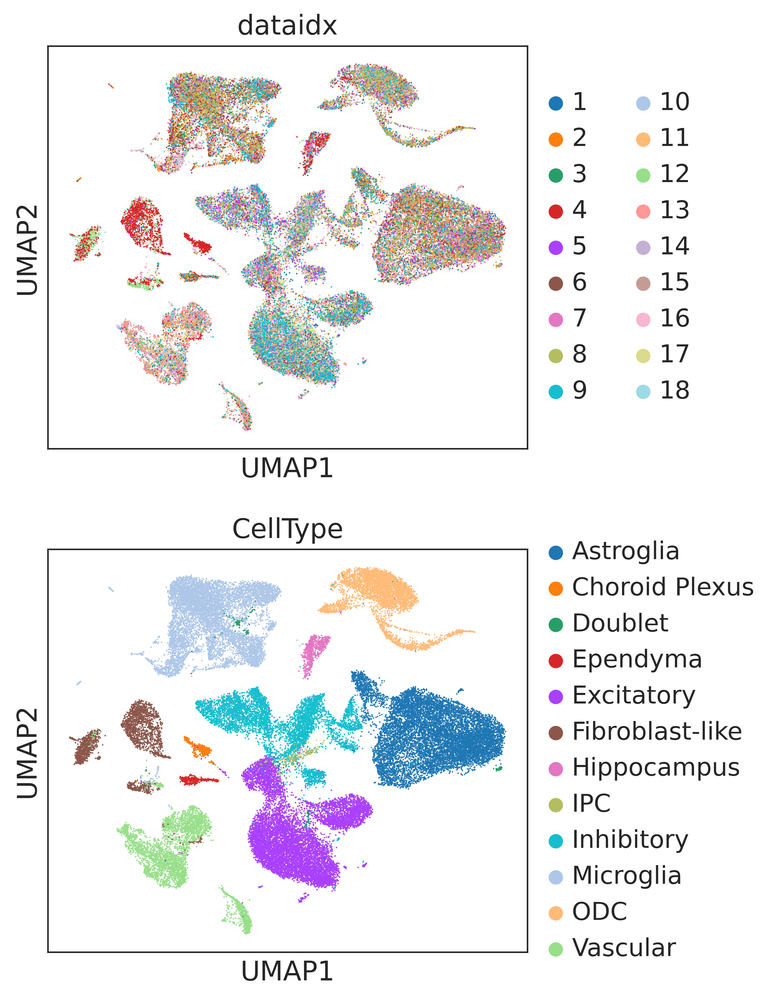

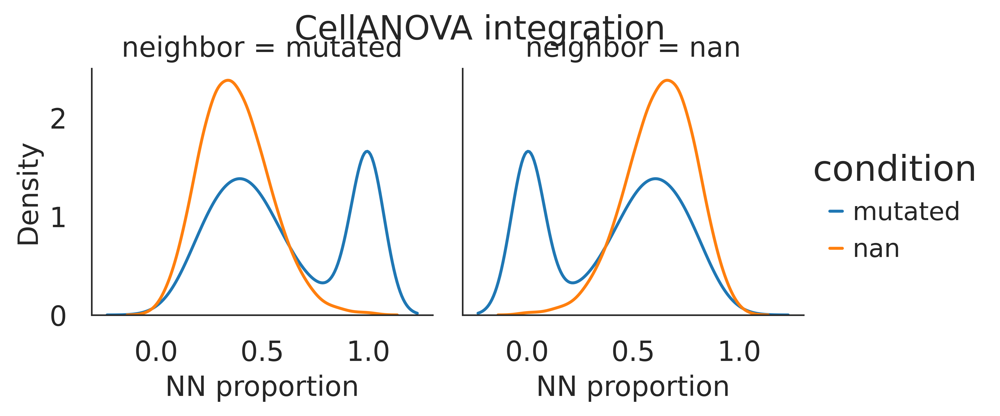

In [5]:
adata=sc.read_h5ad("../data/ASD.h5ad")
run_cell_anova(adata=adata, batch_key='Batch', condition_key='perturb01', control_name='nan', cell_type_label="CellType", dataset_name="ASD")

In [6]:
adata_prep=sc.read_h5ad("./cellanova/" + "ASD" + "_results.h5ad")
integrated = ad.AnnData(adata_prep.layers['denoised'], dtype=np.float32)
integrated.obs = adata_prep.obs.copy()
integrated.var_names = adata_prep.var_names
res = cnova.utils.calc_oobNN(integrated, batch_key='dataidx', condition_key='PseudoState')
print(res.obsm['knn_prop'])

                                mutated       nan
NAME                                             
PertCortex_1_AAACCTGAGAAGCCCA  0.500000  0.500000
PertCortex_1_AAACCTGAGCCACGTC  1.000000  0.000000
PertCortex_1_AAACCTGAGGATCGCA  0.357143  0.642857
PertCortex_1_AAACCTGAGTTCGATC  0.357143  0.642857
PertCortex_1_AAACCTGCAAAGCAAT  0.428571  0.571429
...                                 ...       ...
PertCortex_9_TTTGTCAGTCGCATCG  0.571429  0.428571
PertCortex_9_TTTGTCAGTCTCCCTA  0.642857  0.357143
PertCortex_9_TTTGTCAGTGATGATA  0.214286  0.785714
PertCortex_9_TTTGTCAGTTTGTTTC  0.571429  0.428571
PertCortex_9_TTTGTCATCGAACGGA  1.000000  0.000000

[49067 rows x 2 columns]


In [7]:
df = res.obsm['knn_prop']
print(df)
# Add the 'condition' column
df['condition'] = res.obs['PseudoState']
df.index.name = "index"
'''
df = df.rename(columns={"nan": "not_perturbed"})
df["condition"] = df["condition"].replace("nan", "not_perturbed")
df["index"]=df.index
print(df.columns.tolist())
'''
df = df.reset_index()
print(df)
df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
print(df)

                                mutated       nan
NAME                                             
PertCortex_1_AAACCTGAGAAGCCCA  0.500000  0.500000
PertCortex_1_AAACCTGAGCCACGTC  1.000000  0.000000
PertCortex_1_AAACCTGAGGATCGCA  0.357143  0.642857
PertCortex_1_AAACCTGAGTTCGATC  0.357143  0.642857
PertCortex_1_AAACCTGCAAAGCAAT  0.428571  0.571429
...                                 ...       ...
PertCortex_9_TTTGTCAGTCGCATCG  0.571429  0.428571
PertCortex_9_TTTGTCAGTCTCCCTA  0.642857  0.357143
PertCortex_9_TTTGTCAGTGATGATA  0.214286  0.785714
PertCortex_9_TTTGTCAGTTTGTTTC  0.571429  0.428571
PertCortex_9_TTTGTCATCGAACGGA  1.000000  0.000000

[49067 rows x 2 columns]
                               index   mutated       nan condition
0      PertCortex_1_AAACCTGAGAAGCCCA  0.500000  0.500000   mutated
1      PertCortex_1_AAACCTGAGCCACGTC  1.000000  0.000000   mutated
2      PertCortex_1_AAACCTGAGGATCGCA  0.357143  0.642857   mutated
3      PertCortex_1_AAACCTGAGTTCGATC  0.357143  0.642857

# ASD1

https://singlecell.broadinstitute.org/single_cell/study/SCP1184/in-vivo-perturb-seq-reveals-neuronal-and-glial-abnormalities-associated-with-asd-risk-genes#study-download

2025-01-07 23:03:41,333 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2025-01-07 23:03:45,307 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-01-07 23:03:45,456 - harmonypy - INFO - Iteration 1 of 30


2025-01-07 23:04:00,697 - harmonypy - INFO - Iteration 2 of 30


2025-01-07 23:04:13,106 - harmonypy - INFO - Iteration 3 of 30


2025-01-07 23:04:24,416 - harmonypy - INFO - Iteration 4 of 30


2025-01-07 23:04:33,729 - harmonypy - INFO - Iteration 5 of 30


2025-01-07 23:04:37,927 - harmonypy - INFO - Iteration 6 of 30


2025-01-07 23:04:42,169 - harmonypy - INFO - Iteration 7 of 30


2025-01-07 23:04:53,381 - harmonypy - INFO - Iteration 8 of 30


2025-01-07 23:04:57,585 - harmonypy - INFO - Converged after 8 iterations


{'g1': ['15', '3', '10', '18', '6', '13', '14', '8', '12', '1', '5', '4', '2', '7', '9', '11', '16']}


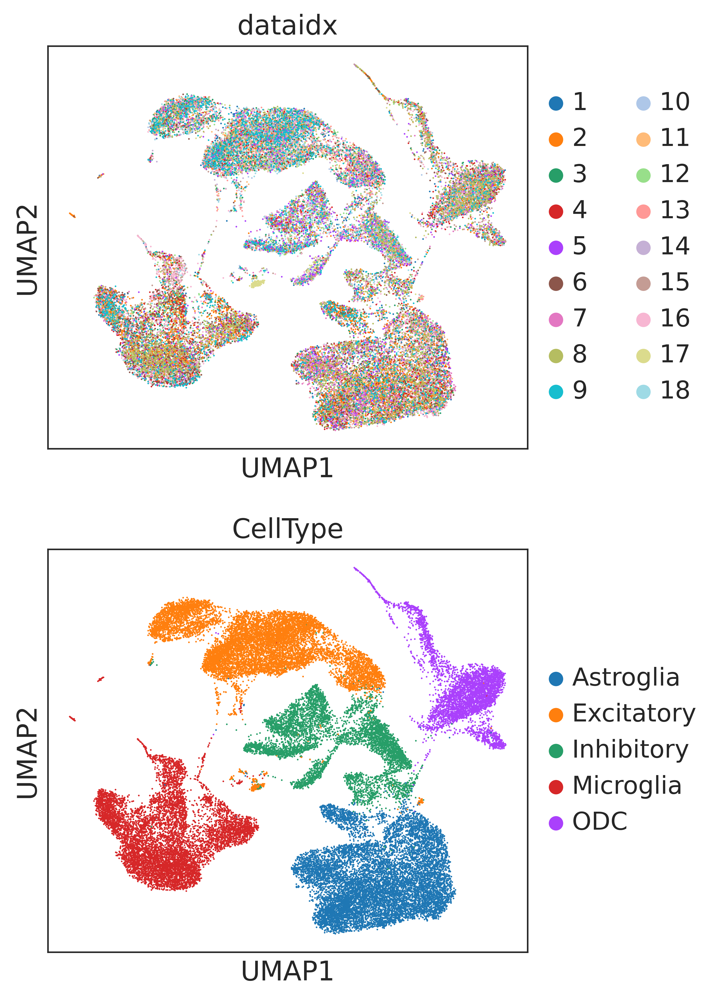

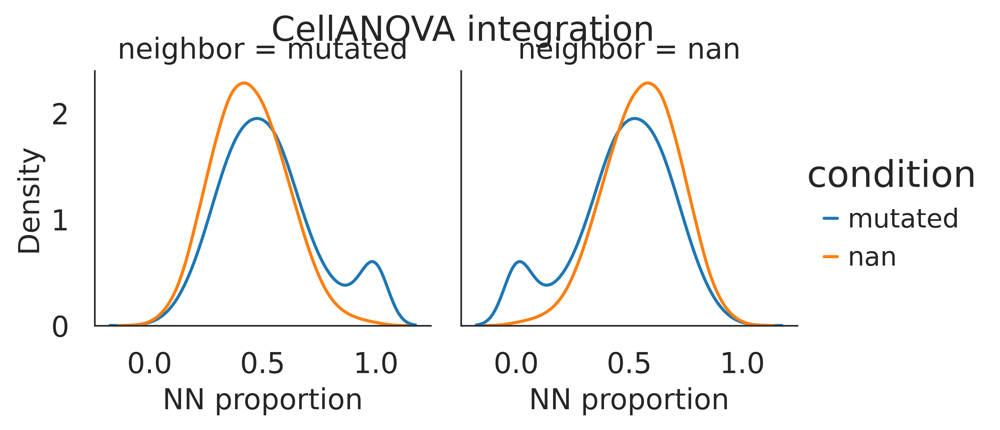

In [8]:
adata=sc.read_h5ad("../data/ASD1.h5ad")
run_cell_anova(adata=adata, batch_key='Batch', condition_key='perturb01', control_name='nan', cell_type_label="CellType", dataset_name="ASD1")